# Possion Noise -- Hernquist Expansion Sampling

In [ ]:
r"""
    TITLE   :
    AUTHOR  :
    PROJECT : disco$\texttt{O}$
""";

__author__ = ['Nathaniel Starkman', 'Christopher Carr']
__version__ = 'Oct 29, 2020'

<span style='font-size:30px;font-weight:650'>
    About
</span>

In this notebook we sample at different densities from a Hernquist sphere and show the errors in the SCF from poisson noise.

We use the:
- [ ] SCF method from Galpy
- [ ] SCF method in Gala (?)
- [ ] DiskSCF method in Galpy
- [ ] SCF method in AGAMA

Relevant Literature:
- A self-consistent field method for galactic dynamics


<br><br>

- - - 

## Prepare


### Imports

In [2]:
import sys
!{sys.executable} -m pip install astropy

     |████████████████████████████████| 10.3 MB 13.0 MB/s eta 0:00:01               | 1.6 MB 13.0 MB/s eta 0:00:01/s eta 0:00:01


In [38]:
# BUILT-IN

# THIRD PARTY
import astropy.coordinates as coord
from astropy import units as u, constants as const

import matplotlib.pyplot as plt
import scipy
from scipy.stats import median_absolute_deviation as mad
# import galpy
# from galpy import potential as gpot
# from galpy import df as gdf

import agama
import numpy as np
# FIRST PARTY

# PROJECT-SPECIFIC

## AGAMA

In [5]:
pot_Hern = agama.Potential(type='Spheroid', mass=1e12, scaleRadius=10, gamma=1, alpha =1, beta=4, cutoffStrength=0) # Hernquist Potential

Text(0, 0.5, 'density [$M_{\\odot}$/kpc$^3$]')

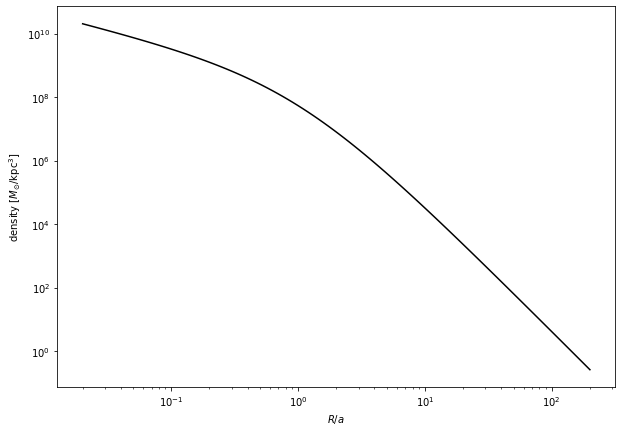

In [4]:
pos = np.zeros((3,100)) * u.kpc
pos[0] = np.logspace(np.log10(20./100.), np.log10(20*100.), pos.shape[1]) * u.kpc
density = pot_Hern.density(pos.T)
pot = pot_Hern.potential(pos.T)
a = 10 * u.kpc

fig,ax = plt.subplots(1, 1, figsize=(10,7))
ax.plot(pos[0]/a, density, color='k')
ax.set_xlabel("$R/a$") 
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_ylabel("density [$M_{\odot}$/kpc$^3$]")

Text(0, 0.5, 'density [$M_{\\odot}$/kpc$^3$]')

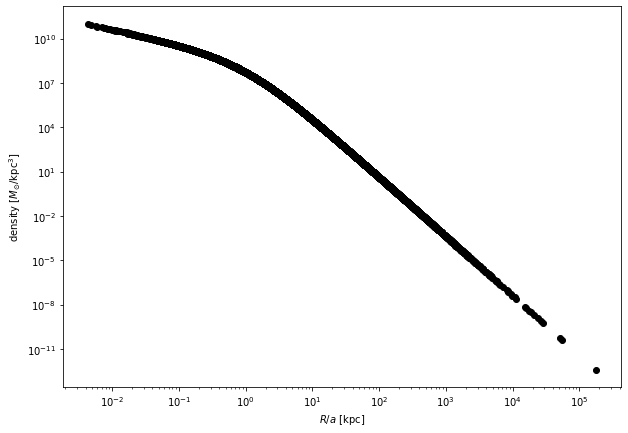

In [5]:
snap = pot_Hern.sample(100000)
R = np.sqrt(snap[0][:,0]**2 + snap[0][:,1]**2 + snap[0][:,2]**2)
Hern_fit = agama.Potential(type = "Multipole",particles=snap,symmetry='a', gridsizeR=20, lmax=2)

density_fit = Hern_fit.density(snap[0])

fig,ax = plt.subplots(1, 1, figsize=(10,7))
ax.scatter(R/a, density_fit, color='k')
ax.set_xlabel("$R/a$") 
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_xlabel("$R/a$ [kpc]") 
ax.set_ylabel("density [$M_{\odot}$/kpc$^3$]")

In [85]:
import sys
!{sys.executable} -m pip install plotly

     |████████████████████████████████| 13.1 MB 9.2 MB/s eta 0:00:01�█████████████▎            | 7.9 MB 9.2 MB/s eta 0:00:01/s eta 0:00:01
  Created wheel for retrying: filename=retrying-1.3.3-py3-none-any.whl size=11429 sha256=ce497154b79e59772af21b98f008c2ec5009b2c7ab617123fba90753f6f4006e
  Stored in directory: /home/jovyan/.cache/pip/wheels/f9/8d/8d/f6af3f7f9eea3553bc2fe6d53e4b287dad18b06a861ac56ddf
Successfully built retrying


In [90]:
from plotly import graph_objects as go

x = snap[0][:,0] * u.kpc
y = snap[0][:,1] * u.kpc
z = snap[0][:,2] * u.kpc

fig = go.Figure(
    data=[
        go.Scatter3d(
            x=x, y=y, z=z,
            mode='markers', marker=dict(size=5))
    ]
)

fig.update_layout(autosize=False, width=1000, height=1000, margin=dict(l=50, r=50, b=100, t=100, pad=4))

## Poisson Statistics

In [19]:
pot_Hern = agama.Potential(type='Spheroid', mass=1e12, scaleRadius=10, gamma=1, alpha =1, beta=4, cutoffStrength=0) # Hernquist Potentia
pos = np.zeros((3,np.int(1e7))) * u.kpc
pos[0] = np.logspace(np.log10(20./100.), np.log10(20*100.), pos.shape[1]) * u.kpc
pot = pot_Hern.potential(pos.T) # Potential evaluated at positions from "pos" array

In [25]:
# Residual Calculation
def residual(pot, pot_fit):
    return pot - pot_fit

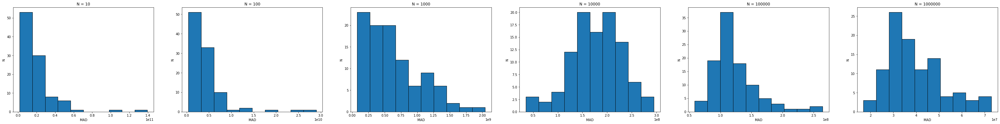

In [73]:
it = 100 # iteration number
N = [10,100,1000, 10000, 100000, 1000000] # sampling numbers
MADs = np.zeros((len(N), it)) # array of median absolute deviations 
fig, ax = plt.subplots(1,len(N),figsize=(55,6))
for i,n in enumerate(N):
    for j in range(0,it):
        snap = pot_Hern.sample(n) # random selection of N particles from potential 
        Hern_fit = agama.Potential(type = "Multipole",particles=snap,symmetry='a', gridsizeR=20, lmax=2) # potential approximation via multiple expanson
        pot_fit = Hern_fit.potential(pos.T) # "continuous" approximated potential 
        res = residual(pot, pot_fit) # "continuous" residual
        MADs[i,j] = mad(res)
        
    ax[i].hist(MADs[i,:], edgecolor='k')
    ax[i].set_xlabel('MAD')
    ax[i].set_ylabel('N')
    ax[i].set_title('N = {.2e}'.format(n))
    
plt.savefig('Hern_MAD.png')

In [76]:
%%time 
print('hello world')

hello world
CPU times: user 488 µs, sys: 137 µs, total: 625 µs
Wall time: 468 µs


<br><br>

- - - 

<span style='font-size:40px;font-weight:650'>
    END
</span>

```
@article{10.1086/171025, 
    title = {{A self-consistent field method for galactic dynamics}}, 
   author = {Hernquist, Lars and Ostriker, Jeremiah P}, 
  journal = {The Astrophysical Journal}, 
     issn = {0004-637X}, 
      doi = {10.1086/171025}, 
    pages = {375}, 
   volume = {386},
}
```

